In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
!pip install annoy

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 647.5/647.5 kB 8.9 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for annoy: filename=annoy-1.17.3-cp310-cp310-linux_x86_64.whl size=552447 sha256=9fbc8717335e1e935310a949b3668ee54a8290a408bfae8190cd9293ae13fad7
  Stored in directory: /root/.cache/pip/wheels/64/8a/da/f714bcf46c5efdcfcac0559e63370c21abe961c48e3992465a
Successfully built annoy


In [3]:
!pip install ipython-autotime
%load_ext autotime

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 14.5 MB/s eta 0:00:00
time: 473 µs (started: 2023-08-10 10:01:28 +00:00)


In [4]:
!pip3 install transformers==4.25.1 timm==0.4.12 fairscale==0.4.4

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.8/5.8 MB 47.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 377.0/377.0 kB 37.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 235.4/235.4 kB 27.0 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Installing backend dependencies ... done
  Preparing metadata (pyproject.toml) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 268.8/268.8 kB 22.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.8/7.8 MB 31.0 MB/s eta 0:00:00
  Created wheel for fairscale: filename=fairscale-0.4.4-py3-none-any.whl size=292831 sha256=aad6cc91bd1eeadaa229e775b1b88c6e555a40ed7e568b44e941be6ace63e94d
  Stored in directory: /root/.cache/pip/wheels/08/58/6f/56c57fa8315eb0bcf0287b580c850845be5f116359b809e9f1
Successfully built fairscale
time: 54.9 s (started: 2023-08-10 10:01:29 +00:00)


In [5]:
!git clone https://github.com/salesforce/BLIP
%cd BLIP

Cloning into 'BLIP'...
remote: Enumerating objects: 277, done.
remote: Counting objects: 100% (165/165), done.
remote: Compressing objects: 100% (30/30), done.
remote: Total 277 (delta 137), reused 136 (delta 135), pack-reused 112
Receiving objects: 100% (277/277), 7.03 MiB | 28.93 MiB/s, done.
Resolving deltas: 100% (153/153), done.
/content/BLIP
time: 1.01 s (started: 2023-08-10 10:02:23 +00:00)


In [6]:
from PIL import Image, ImageDraw
import requests
import torch
from torchvision import transforms
from torchvision.transforms.functional import InterpolationMode

import os
from glob import glob
from annoy import AnnoyIndex
from IPython.display import display
from tqdm import tqdm

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

def load_image(image_path, image_size, show_image=False):
  image = Image.open(image_path).convert('RGB')
  if show_image:
    display(image)
  transform = transforms.Compose([
    transforms.Resize((image_size, image_size), interpolation=InterpolationMode.BICUBIC),
    transforms.ToTensor(),
    transforms.Normalize((0.48145466, 0.4578275, 0.40821073), (0.26862954, 0.26130258, 0.27577711))
    ])
  image = transform(image).unsqueeze(0).to(device)
  return image

time: 7.72 s (started: 2023-08-10 10:02:24 +00:00)


In [7]:
from models.med import BertConfig, BertModel
from transformers import BertTokenizer

import torch
from torch import nn
import torch.nn.functional as F

from models.blip import create_vit, init_tokenizer, load_checkpoint
model_url = 'https://storage.googleapis.com/sfr-vision-language-research/BLIP/models/model_base_retrieval_coco.pth'
class My_BLIP(nn.Module):
    def __init__(self,
                 med_config = 'configs/med_config.json',
                 image_size = 384,
                 vit = 'base',
                 vit_grad_ckpt = False,
                 vit_ckpt_layer = 0,
                 embed_dim = 256,
                 ):
        """
        Args:
            med_config (str): path for the mixture of encoder-decoder model's configuration file
            image_size (int): input image size
            vit (str): model size of vision transformer
        """
        super().__init__()

        self.visual_encoder, vision_width = create_vit(vit,image_size, vit_grad_ckpt, vit_ckpt_layer)
        self.tokenizer = init_tokenizer()
        med_config = BertConfig.from_json_file(med_config)
        med_config.encoder_width = vision_width
        self.text_encoder = BertModel(config=med_config, add_pooling_layer=False)

        text_width = self.text_encoder.config.hidden_size

        self.vision_proj = nn.Linear(vision_width, embed_dim)
        self.text_proj = nn.Linear(text_width, embed_dim)
        self.vision_width = vision_width
        self.text_width = text_width
        self.itm_head = nn.Linear(text_width, 2)


    def forward(self, image, caption, match_head='itm'):

        image_embeds = self.visual_encoder(image)
        image_atts = torch.ones(image_embeds.size()[:-1],dtype=torch.long).to(image.device)

        text = self.tokenizer(caption, padding='max_length', truncation=True, max_length=35,
                              return_tensors="pt").to(image.device)


        if match_head=='itm':
            output = self.text_encoder(text.input_ids,
                                       attention_mask = text.attention_mask,
                                       encoder_hidden_states = image_embeds,
                                       encoder_attention_mask = image_atts,
                                       return_dict = True,
                                      )
            itm_output = self.itm_head(output.last_hidden_state[:,0,:])
            return itm_output

        elif match_head=='itc':
            text_output = self.text_encoder(text.input_ids, attention_mask = text.attention_mask,
                                            return_dict = True, mode = 'text')
            image_feat = F.normalize(self.vision_proj(image_embeds[:,0,:]),dim=-1)
            text_feat = F.normalize(self.text_proj(text_output.last_hidden_state[:,0,:]),dim=-1)

            sim = image_feat @ text_feat.t()
            return sim
    #get features and matching
    def get_text_features(self, caption, device):
        text = self.tokenizer(caption, padding='max_length', truncation=True, max_length=35,
                              return_tensors="pt").to(device)
        text_output = self.text_encoder(text.input_ids, attention_mask = text.attention_mask,
                                            return_dict = True, mode = 'text')
        # print(text_output.last_hidden_state.shape)
        text_feat = F.normalize(self.text_proj(text_output.last_hidden_state[:,0,:]),dim=-1)
        return text_feat
    def get_image_features(self, image):
        image_embeds = self.visual_encoder(image)
        # print(image_embeds.shape)
        image_feat = F.normalize(self.vision_proj(image_embeds[:,0,:]),dim=-1)
        return image_feat

    def get_fts_img(self, image):
        image_embeds = self.visual_encoder(image)
        image_atts = torch.ones(image_embeds.size()[:-1],dtype=torch.long).to(image.device)
        return image_embeds
    def matching(self, caption, image_embeds, image_atts):
        text = self.tokenizer(caption, padding='max_length', truncation=True, max_length=35,
                                return_tensors="pt").to(image.device)
        output = self.text_encoder(text.input_ids,
                                        attention_mask = text.attention_mask,
                                        encoder_hidden_states = image_embeds,
                                        encoder_attention_mask = image_atts,
                                        return_dict = True,
                                        )
        itm_output = self.itm_head(output.last_hidden_state[:,0,:])
        print('test', output.last_hidden_state[:,0,:])
        print('shape', output.last_hidden_state[:,0,:].shape)
        return itm_output


def my_blip_itm(pretrained='',**kwargs):
    model = My_BLIP(**kwargs)
    if pretrained:
        model,msg = load_checkpoint(model,pretrained)
        assert(len(msg.missing_keys)==0)
    return model

time: 9.78 s (started: 2023-08-10 10:02:32 +00:00)


In [8]:
image_size = 384
model = my_blip_itm(pretrained=model_url, image_size=image_size, vit='base')
model.eval()
model = model.to(device=device)

100%|██████████| 1.78G/1.78G [00:21<00:00, 87.8MB/s]


load checkpoint from https://storage.googleapis.com/sfr-vision-language-research/BLIP/models/model_base_retrieval_coco.pth
time: 52.6 s (started: 2023-08-10 10:02:42 +00:00)


In [13]:
import pickle
with open('/content/drive/MyDrive/AIC_notebook/list_image_path_C00_V0001.pkl', 'rb') as f:
    list_image_path = pickle.load(f)
print(list_image_path[0:10]) # Kết quả: [1, 2, 3, 4, 5]

['/content/drive/MyDrive/AIC_notebook/C00_V0001/005740.jpg', '/content/drive/MyDrive/AIC_notebook/C00_V0001/013693.jpg', '/content/drive/MyDrive/AIC_notebook/C00_V0001/008582.jpg', '/content/drive/MyDrive/AIC_notebook/C00_V0001/020680.jpg', '/content/drive/MyDrive/AIC_notebook/C00_V0001/000749.jpg', '/content/drive/MyDrive/AIC_notebook/C00_V0001/016539.jpg', '/content/drive/MyDrive/AIC_notebook/C00_V0001/007580.jpg', '/content/drive/MyDrive/AIC_notebook/C00_V0001/004476.jpg', '/content/drive/MyDrive/AIC_notebook/C00_V0001/004626.jpg', '/content/drive/MyDrive/AIC_notebook/C00_V0001/020916.jpg']
time: 923 ms (started: 2023-08-10 08:21:38 +00:00)


In [14]:
from torchvision import transforms
from albumentations.pytorch import ToTensorV2 # np.array -> torch.tensor
from torch.utils.data import Dataset, DataLoader
import numpy as np
import cv2
import matplotlib.pyplot as plt
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
class TorchvisionDataset(Dataset):
    def __init__(self, root_dir, transform=None, lst_path=None):
        self.root_dir = root_dir
        self.transform = transform
        self.img_path_list = glob(os.path.join(self.root_dir, '*.jpg'))
        self.lst_path = lst_path
        self.file_path = []
    def __len__(self):
        return len(self.img_path_list)

    def __getitem__(self, idx, show_image=False):
        if self.lst_path is not None:
          self.file_path = self.lst_path
        else:
          self.file_path = self.img_path_list
        # Read an image with PIL
        img_path = self.file_path[idx]
        image = cv2.imread(img_path)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        if show_image:
          plt.imshow(image)
          plt.show()
        image = cv2.resize(image, (384, 384))
        # image = vis_processors["eval"](Image.fromarray(image.astype(np.uint8))).to(device)
        # image = image.astype('float')
        # image = Image.open(file_path).convert('RGB')
        # if show_image:
        #   display(image)
        # image = vis_processors["eval"](image).to(device)
        if self.transform:
            image = self.transform(image)
        return image
    def get_img_path(self, idx):
      return self.file_path[idx]

class convertToTensor:
  def __call__(self, image):
    # opencv image: H x W x C
    # torch tensor: C x H x W
    image = torch.from_numpy(image).permute(2, 0, 1).float()
    return image

torchvision_transform = transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize((0.48145466, 0.4578275, 0.40821073), (0.26862954, 0.26130258, 0.27577711))
    ])
Ten2PIL = transforms.ToPILImage()

time: 1.32 s (started: 2023-08-10 08:21:39 +00:00)


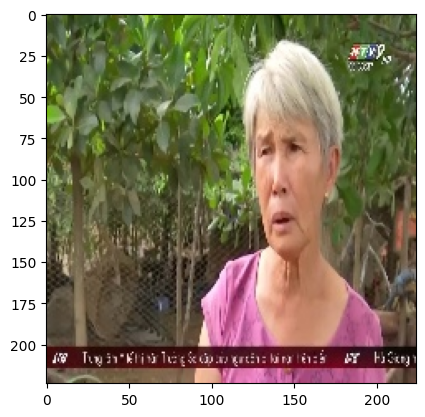

/content/drive/MyDrive/AIC_notebook/C00_V0001/005740.jpg
time: 8.06 s (started: 2023-08-10 08:21:41 +00:00)


In [15]:
test_dataset_vision = TorchvisionDataset("/content/drive/MyDrive/AIC_notebook/C00_V0001",torchvision_transform, lst_path=list_image_path)
image = test_dataset_vision.__getitem__(0, show_image=True)
print(test_dataset_vision.get_img_path(0))

In [16]:
#load data
batch_size = 64
n_worker = os.cpu_count()
print("num_worker", n_worker)
test_dataloader_vision = DataLoader(test_dataset_vision, batch_size=batch_size, shuffle=False, num_workers=n_worker)

num_worker 2
time: 1.9 ms (started: 2023-08-10 08:21:49 +00:00)


In [17]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

def load_demo_image(image_size,device, img_url):
    # img_url = 'https://storage.googleapis.com/sfr-vision-language-research/BLIP/demo.jpg'
    try:
      raw_image = Image.open(requests.get(img_url, stream=True).raw).convert('RGB')
    except:
      raw_image = Image.open(img_url)
    w,h = raw_image.size
    display(raw_image.resize((image_size,image_size)))

    transform = transforms.Compose([
        transforms.Resize((image_size,image_size),interpolation=InterpolationMode.BICUBIC),
        transforms.ToTensor(),
        transforms.Normalize((0.48145466, 0.4578275, 0.40821073), (0.26862954, 0.26130258, 0.27577711))
        ])
    image = transform(raw_image).unsqueeze(0).to(device)
    return image

time: 1.17 ms (started: 2023-08-10 08:25:34 +00:00)


# Build annoy

In [ ]:
from tqdm import tqdm
j=0
annoy_index = AnnoyIndex(256, 'angular')
with torch.no_grad():
  for sample in (tqdm(test_dataloader_vision)):
    output_feature = model.get_fts_img(sample.to(device))
    for i in range(output_feature.shape[0]):
      annoy_index.add_item(i+j, output_feature[i])
      print(i+j)
    j = j + output_feature.shape[0]

In [ ]:
annoy_index.build(1000)   # 64 trees
annoy_index.save('/content/drive/MyDrive/AIC_notebook/C00_V0001_index_1000_trees_BLIP2.ann')

In [ ]:
print(output_feature.shape)

torch.Size([64, 577, 768])
time: 1.82 ms (started: 2023-08-08 12:53:41 +00:00)


# Save Image_path

In [ ]:
# import pickle
# # Lưu danh sách vào tệp
# with open('/content/drive/MyDrive/AIC_notebook/img_embedding_C00_V0001.pkl', 'wb') as f:
#     pickle.dump(lst[0:10], f)

NameError: ignored

time: 10.4 s (started: 2023-08-09 10:50:29 +00:00)


In [ ]:
import pickle
with open('/content/drive/MyDrive/AIC_notebook/list_image_path.pkl', 'rb') as f:
    list_image_path = pickle.load(f)
print(list_image_path[0:10])  # Kết quả: [1, 2, 3, 4, 5]

['/content/drive/MyDrive/AIC_notebook/C00_V0000/000987.jpg', '/content/drive/MyDrive/AIC_notebook/C00_V0000/002143.jpg', '/content/drive/MyDrive/AIC_notebook/C00_V0000/002734.jpg', '/content/drive/MyDrive/AIC_notebook/C00_V0000/000797.jpg', '/content/drive/MyDrive/AIC_notebook/C00_V0000/000079.jpg', '/content/drive/MyDrive/AIC_notebook/C00_V0000/001119.jpg', '/content/drive/MyDrive/AIC_notebook/C00_V0000/003098.jpg', '/content/drive/MyDrive/AIC_notebook/C00_V0000/001777.jpg', '/content/drive/MyDrive/AIC_notebook/C00_V0000/003810.jpg', '/content/drive/MyDrive/AIC_notebook/C00_V0000/003695.jpg']
time: 4.53 ms (started: 2023-08-06 08:34:10 +00:00)


# Load Annoy and image_path

In [9]:
#load ann
from annoy import AnnoyIndex
index = AnnoyIndex(256, 'angular')
index.load('/content/drive/MyDrive/AIC_notebook/C00_V0000_index_1000_trees.ann')
index1 = AnnoyIndex(256, 'angular')
index1.load('/content/drive/MyDrive/AIC_notebook/C00_V0001_index_1000_trees_loader.ann')
import pickle
with open('/content/drive/MyDrive/AIC_notebook/list_image_path.pkl', 'rb') as f:
    list_image_path = pickle.load(f)
import pickle
with open('/content/drive/MyDrive/AIC_notebook/list_image_path_C00_V0001.pkl', 'rb') as f:
    list_image_path1 = pickle.load(f)

time: 2.76 s (started: 2023-08-10 10:03:35 +00:00)


0.20792651176452637


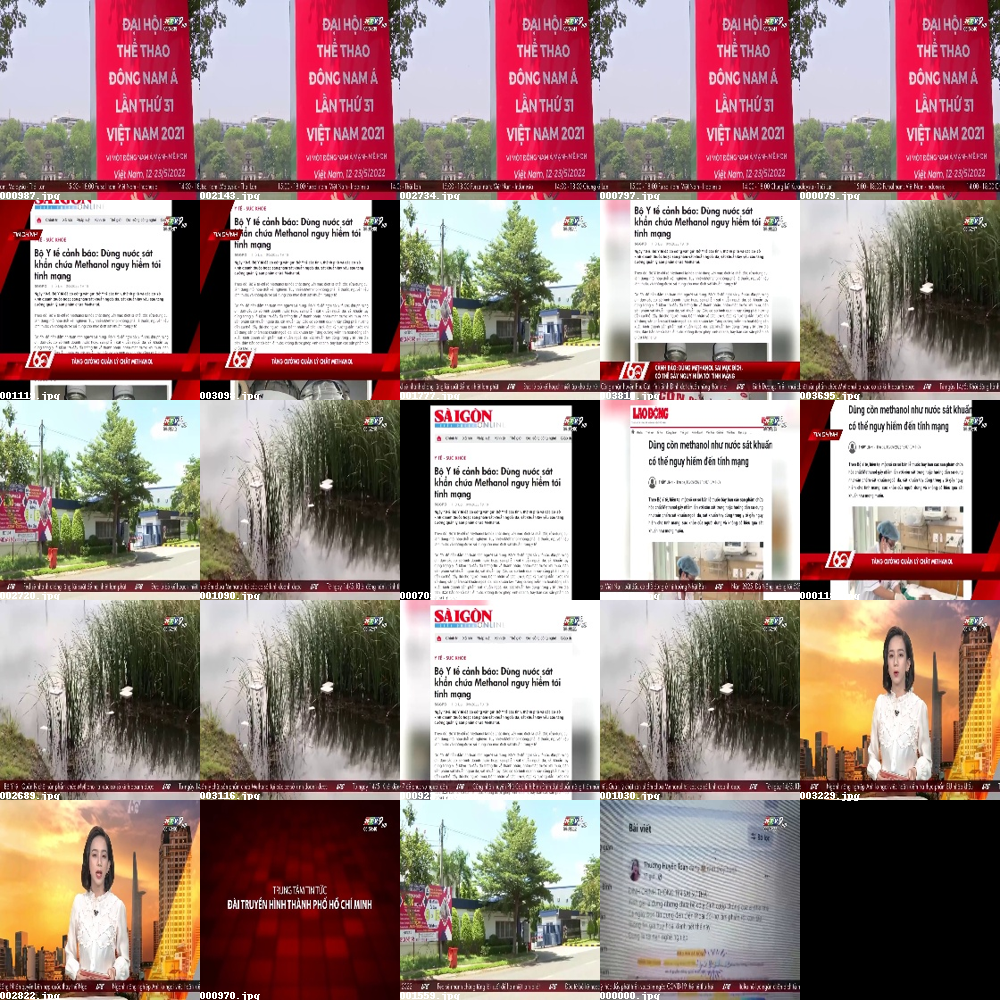

time: 800 ms (started: 2023-08-10 10:20:54 +00:00)


In [21]:
import time
start = time.time()
caption = 'DAI HOI THE THAO DONG NAM A'
#list_image_path = glob(os.path.join('/content/drive/MyDrive/AIC_notebook/C00_V0000', '*.jpg'))
with torch.no_grad():
  text_feature = model.get_text_features(caption, device=device).squeeze(0)
  #img_feature = model.get_image_features(test_image_input).squeeze(0)
index_image = index.get_nns_by_vector(text_feature, 24)
end = time.time()
print(end-start)
image_grid = Image.new('RGB', (1000, 1000))
for j in range(24):
  search_image = Image.open(list_image_path[index_image[j]])
  search_image = search_image.resize((200, 200))
  image_grid.paste(search_image, ((200*((j)%5), 200*((j)//5) )))
  # Lấy tên file (đường dẫn) từ đường dẫn đầy đủ
  title = os.path.basename(list_image_path[j])
  draw = ImageDraw.Draw(image_grid)
  draw.text((200 * (j % 5), 200 * (j // 5) + 190), title, fill=(255, 255, 255))
display(image_grid)

In [15]:
import torch

time: 8.06 ms (started: 2023-08-10 10:14:01 +00:00)


In [22]:
image_grid = Image.new('RGB', (1000, 1000))

time: 6.92 ms (started: 2023-08-10 10:25:11 +00:00)


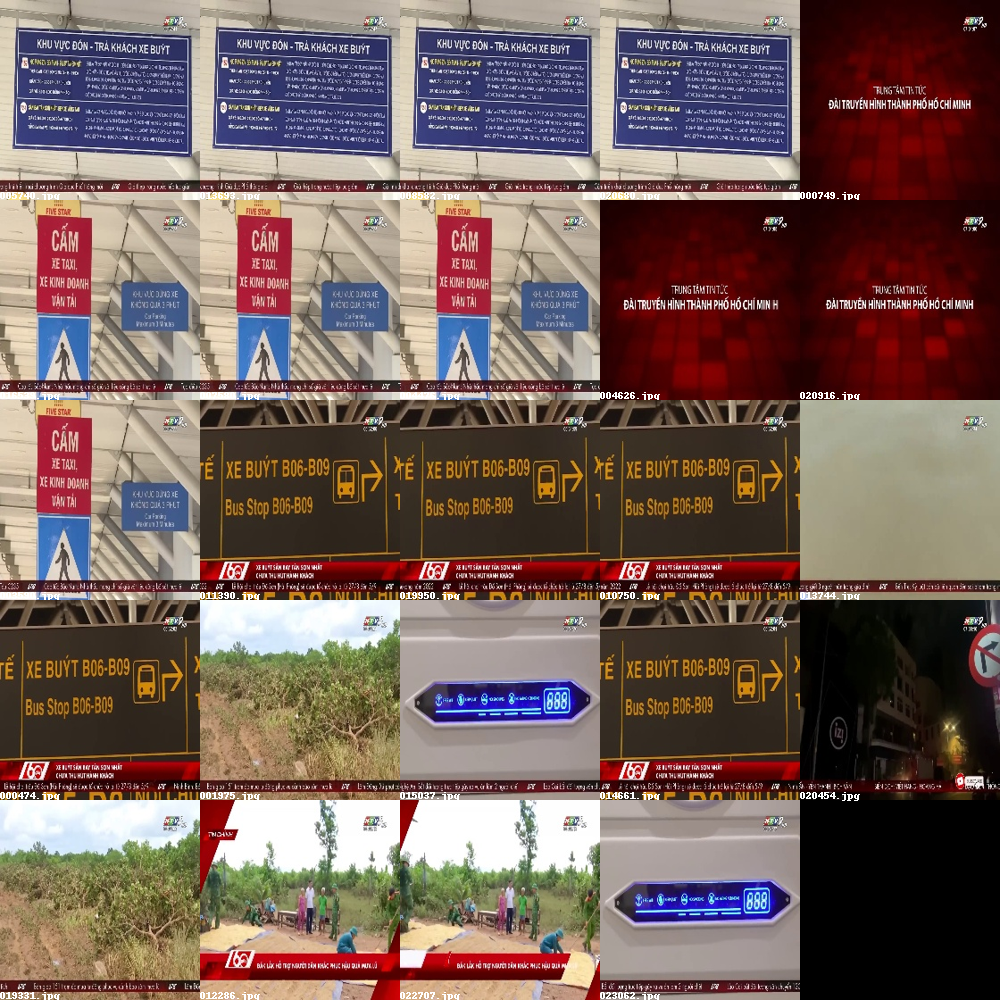

time: 979 ms (started: 2023-08-10 10:25:14 +00:00)


In [23]:
caption = 'The sign has the word "KHU VUC DON TRA KHACH" on it'
with torch.no_grad():
  text_feature = model.get_text_features(caption, device=device).squeeze(0)
  #mg_feature = model.get_image_features(test_image_input).squeeze(0)
index_image = index1.get_nns_by_vector(text_feature, 24)

# test_image = test_image.resize((200, 200))
# image_draw = ImageDraw.Draw(test_image)
# image_draw.rectangle([(0, 0), (199, 199)], outline = 'red', width = 8)
# image_grid.paste(test_image, ((0, 0)))
for j in range(24):
  search_image = Image.open(list_image_path1[index_image[j]])
  search_image = search_image.resize((200, 200))
  image_grid.paste(search_image, ((200*((j)%5), 200*((j)//5) )))
  # Lấy tên file (đường dẫn) từ đường dẫn đầy đủ
  title = os.path.basename(list_image_path1[j])
  draw = ImageDraw.Draw(image_grid)
  draw.text((200 * (j % 5), 200 * (j // 5) + 190), title, fill=(255, 255, 255))

display(image_grid)

In [24]:
image_grid = Image.new('RGB', (1000, 2000))

time: 2.81 ms (started: 2023-08-10 10:25:34 +00:00)


0.16579055786132812


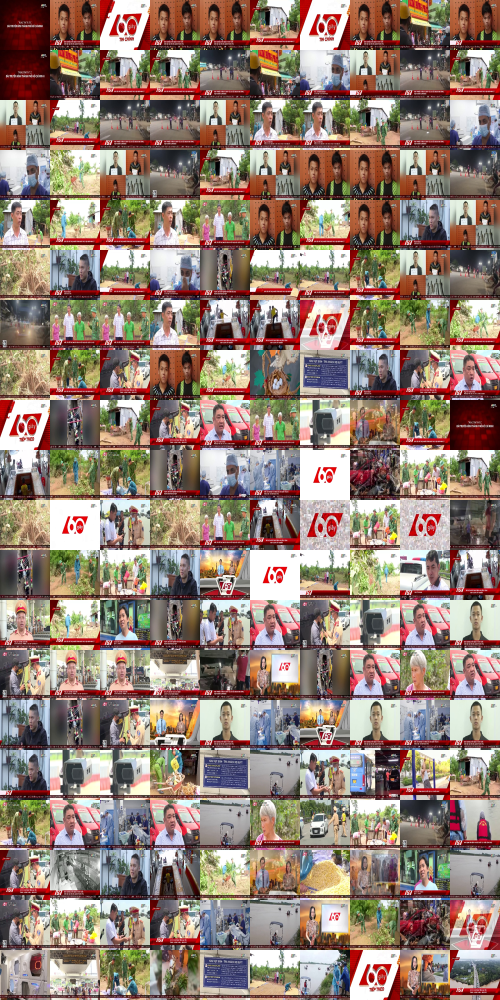

time: 17.8 s (started: 2023-08-10 10:31:18 +00:00)


In [31]:
start = time.time()
caption = 'With 5 goals in the last 2 matches against Binh Thuan and Ba Ria Vung Tau, Thanh Nhan became the best scorer of PVF-CAND (with the same 7 goals as Le Minh Binh) and ranked 2nd in the race of the top scorer in Vietnam. First place prize'
import torch
with torch.no_grad():
  text_feature = model.get_text_features(caption, device=device).squeeze(0)
  #mg_feature = model.get_image_features(test_image_input).squeeze(0)
index_image = index1.get_nns_by_vector(text_feature, 200)
end = time.time()
print(end-start)
# test_image = test_image.resize((200, 200))
# image_draw = ImageDraw.Draw(test_image)
# image_draw.rectangle([(0, 0), (199, 199)], outline = 'red', width = 8)
# image_grid.paste(test_image, ((0, 0)))
for j in range(200):
  search_image = Image.open(list_image_path1[index_image[j]])
  search_image = search_image.resize((100, 100))
  image_grid.paste(search_image, ((100*((j)%10), 100*((j)//10) )))
  # Lấy tên file (đường dẫn) từ đường dẫn đầy đủ
  title = os.path.basename(list_image_path1[j])
  draw = ImageDraw.Draw(image_grid)
  draw.text((200 * (j % 5), 200 * (j // 5) + 190), title, fill=(255, 255, 255))

display(image_grid)

0.2536776065826416


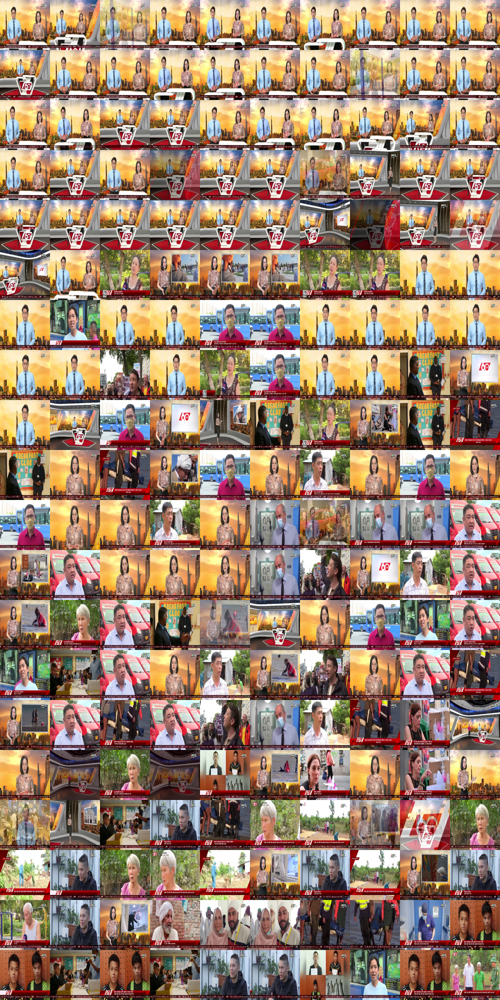

time: 5.01 s (started: 2023-08-10 10:28:27 +00:00)


In [27]:
start = time.time()
caption = 'there are two editors hosting the program, one male is wearing a blue shirt and tie, the female is wearing a brown shirt, the background is blue'
with torch.no_grad():
  text_feature = model.get_text_features(caption, device).squeeze(0)
  #mg_feature = model.get_image_features(test_image_input).squeeze(0)
index_image = index1.get_nns_by_vector(text_feature, 200)
end = time.time()
print(end-start)
image_grid = Image.new('RGB', (1000, 2000))

# test_image = test_image.resize((200, 200))
# image_draw = ImageDraw.Draw(test_image)
# image_draw.rectangle([(0, 0), (199, 199)], outline = 'red', width = 8)
# image_grid.paste(test_image, ((0, 0)))
for j in range(200):
  search_image = Image.open(list_image_path1[index_image[j]])
  search_image = search_image.resize((100, 100))
  image_grid.paste(search_image, ((100*((j)%10), 100*((j)//10) )))
  # Lấy tên file (đường dẫn) từ đường dẫn đầy đủ
  title = os.path.basename(list_image_path1[j])
  draw = ImageDraw.Draw(image_grid)
  draw.text((200 * (j % 5), 200 * (j // 5) + 190), title, fill=(255, 255, 255))

display(image_grid)

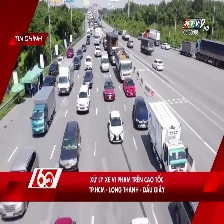

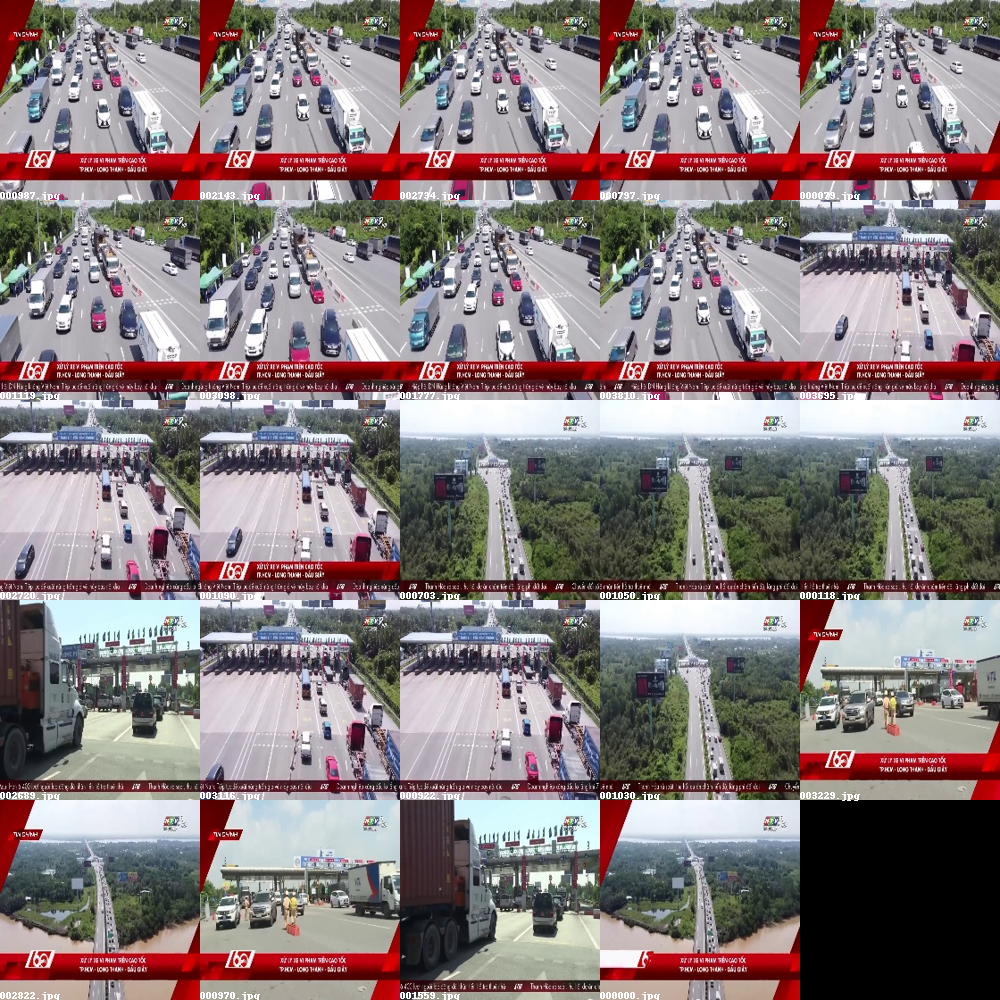

time: 5.26 s (started: 2023-08-09 11:10:55 +00:00)


In [ ]:
test_image_input = load_image('/content/drive/MyDrive/AIC_notebook/C00_V0001/000639.jpg', image_size, show_image=True)
with torch.no_grad():
  img_feature = model.get_image_features(test_image_input).squeeze(0)
index_image = index1.get_nns_by_vector(img_feature, 24)

image_grid = Image.new('RGB', (1000, 1000))

# test_image = test_image.resize((200, 200))
# image_draw = ImageDraw.Draw(test_image)
# image_draw.rectangle([(0, 0), (199, 199)], outline = 'red', width = 8)
# image_grid.paste(test_image, ((0, 0)))
for j in range(24):
  search_image = Image.open(list_image_path1[index_image[j]])
  search_image = search_image.resize((200, 200))
  image_grid.paste(search_image, ((200*((j)%5), 200*((j)//5) )))
  # Lấy tên file (đường dẫn) từ đường dẫn đầy đủ
  title = os.path.basename(list_image_path[j])
  draw = ImageDraw.Draw(image_grid)
  draw.text((200 * (j % 5), 200 * (j // 5) + 190), title, fill=(255, 255, 255))

display(image_grid)